<a href="https://colab.research.google.com/github/JosueAfouda/Air_Pollution_Dashboard/blob/main/french_real_estate_prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Problématique Business

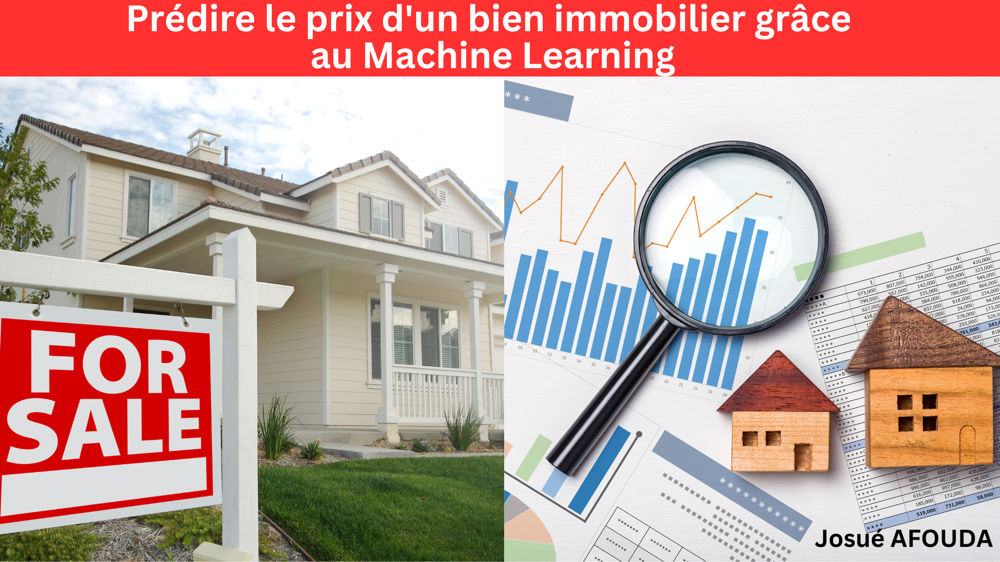

In [1]:
from google.colab import drive
drive.mount('/content/drive')
import os
os.chdir('drive/My Drive/Projets_ML/FrenchRealEstatePrediction')

Mounted at /content/drive


![](1.png)

In [2]:
!ls

1.png  3.png  final_model.pkl			   X_train_J01Z4CN.csv
2.png  4.png  french_real_estate_prediction.ipynb  y_train_OXxrJt1.csv


In [3]:
import pandas as pd
features = pd.read_csv('X_train_J01Z4CN.csv')
print(features.info())
features.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37368 entries, 0 to 37367
Data columns (total 27 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   id_annonce                   37368 non-null  int64  
 1   property_type                37368 non-null  object 
 2   approximate_latitude         37368 non-null  float64
 3   approximate_longitude        37368 non-null  float64
 4   city                         37368 non-null  object 
 5   postal_code                  37368 non-null  int64  
 6   size                         36856 non-null  float64
 7   floor                        9743 non-null   float64
 8   land_size                    15581 non-null  float64
 9   energy_performance_value     19068 non-null  float64
 10  energy_performance_category  19068 non-null  object 
 11  ghg_value                    18530 non-null  float64
 12  ghg_category                 18530 non-null  object 
 13  exposition      

,id_annonce,property_type,approximate_latitude,approximate_longitude,city,postal_code,size,floor,land_size,energy_performance_value,...,nb_parking_places,nb_boxes,nb_photos,has_a_balcony,nb_terraces,has_a_cellar,has_a_garage,has_air_conditioning,last_floor,upper_floors
0,35996577,appartement,43.643880,7.117183,villeneuve-loubet,6270,63.0,NaN,NaN,NaN,...,0.0,0.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,35811033,appartement,45.695757,4.895610,venissieux,69200,90.0,3.0,NaN,223.0,...,0.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,35731841,maison,47.966791,-1.220451,moutiers,35130,61.0,NaN,370.0,NaN,...,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,35886765,maison,47.289292,-1.878805,cordemais,44360,142.0,NaN,764.0,217.0,...,0.0,1.0,8.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,35781137,appartement,45.718992,4.844234,lyon-7eme,69007,88.0,3.0,NaN,NaN,...,0.0,1.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
# Target
labels = pd.read_csv('y_train_OXxrJt1.csv')
print(labels.info())
labels.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37368 entries, 0 to 37367
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   id_annonce  37368 non-null  int64  
 1   price       37368 non-null  float64
dtypes: float64(1), int64(1)
memory usage: 584.0 KB
None


,id_annonce,price
0,35996577,355000.0
1,35811033,190000.0
2,35731841,39000.0
3,35886765,299000.0
4,35781137,478000.0


In [5]:
df = features.merge(labels, on='id_annonce')
print(df.info())
df.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 37368 entries, 0 to 37367
Data columns (total 28 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   id_annonce                   37368 non-null  int64  
 1   property_type                37368 non-null  object 
 2   approximate_latitude         37368 non-null  float64
 3   approximate_longitude        37368 non-null  float64
 4   city                         37368 non-null  object 
 5   postal_code                  37368 non-null  int64  
 6   size                         36856 non-null  float64
 7   floor                        9743 non-null   float64
 8   land_size                    15581 non-null  float64
 9   energy_performance_value     19068 non-null  float64
 10  energy_performance_category  19068 non-null  object 
 11  ghg_value                    18530 non-null  float64
 12  ghg_category                 18530 non-null  object 
 13  exposition      

,id_annonce,property_type,approximate_latitude,approximate_longitude,city,postal_code,size,floor,land_size,energy_performance_value,...,nb_boxes,nb_photos,has_a_balcony,nb_terraces,has_a_cellar,has_a_garage,has_air_conditioning,last_floor,upper_floors,price
0,35996577,appartement,43.643880,7.117183,villeneuve-loubet,6270,63.0,NaN,NaN,NaN,...,0.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,355000.0
1,35811033,appartement,45.695757,4.895610,venissieux,69200,90.0,3.0,NaN,223.0,...,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,190000.0
2,35731841,maison,47.966791,-1.220451,moutiers,35130,61.0,NaN,370.0,NaN,...,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39000.0
3,35886765,maison,47.289292,-1.878805,cordemais,44360,142.0,NaN,764.0,217.0,...,1.0,8.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,299000.0
4,35781137,appartement,45.718992,4.844234,lyon-7eme,69007,88.0,3.0,NaN,NaN,...,1.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,478000.0


In [6]:
df.isna().sum()

id_annonce                         0
property_type                      0
approximate_latitude               0
approximate_longitude              0
city                               0
postal_code                        0
size                             512
floor                          27625
land_size                      21787
energy_performance_value       18300
energy_performance_category    18300
ghg_value                      18838
ghg_category                   18838
exposition                     28274
nb_rooms                        1566
nb_bedrooms                     2733
nb_bathrooms                   13273
nb_parking_places                  0
nb_boxes                           0
nb_photos                          0
has_a_balcony                      0
nb_terraces                        0
has_a_cellar                       0
has_a_garage                       0
has_air_conditioning               0
last_floor                         0
upper_floors                       0
p

In [7]:
df.duplicated().sum()

0

In [8]:
from sklearn.model_selection import train_test_split
seed=123
train_set, test_set = train_test_split(
    df.drop('id_annonce', axis=1), test_size=0.2,
    random_state=seed
)
print("train shape:", train_set.shape, "test shape:", test_set.shape)

train shape: (29894, 27) test shape: (7474, 27)


# Analyse exploratoire

In [9]:
real_estate = train_set.copy()

## Feature Engineering

In [10]:
real_estate['living_area_per_total_land'] = real_estate['size']/real_estate['land_size']
real_estate['living_area_per_total_land']

10813           NaN
28163    262.088235
2732       0.015584
11636           NaN
34955           NaN
            ...    
7763       0.034836
15377      0.030000
17730      0.719424
28030           NaN
15725      0.226777
Name: living_area_per_total_land, Length: 29894, dtype: float64

In [11]:
real_estate['total_number_of_rooms'] = real_estate['nb_rooms'] + real_estate['nb_bedrooms'] + real_estate['nb_bathrooms']
real_estate['total_number_of_rooms']

10813    11.0
28163     8.0
2732     11.0
11636     NaN
34955     NaN
         ... 
7763      8.0
15377     NaN
17730    15.0
28030     NaN
15725     8.0
Name: total_number_of_rooms, Length: 29894, dtype: float64

In [12]:
real_estate['bedrooms_per_room'] = real_estate['nb_bedrooms']/real_estate['total_number_of_rooms']
real_estate['bedrooms_per_room']

10813    0.454545
28163    0.375000
2732     0.272727
11636         NaN
34955         NaN
           ...   
7763     0.375000
15377         NaN
17730    0.400000
28030         NaN
15725    0.375000
Name: bedrooms_per_room, Length: 29894, dtype: float64

In [13]:
real_estate['total_parking_capacity'] = real_estate['nb_parking_places'] + real_estate['nb_boxes']
real_estate['total_parking_capacity']

10813    1.0
28163    0.0
2732     0.0
11636    0.0
34955    0.0
        ... 
7763     0.0
15377    1.0
17730    0.0
28030    1.0
15725    1.0
Name: total_parking_capacity, Length: 29894, dtype: float64

In [14]:
real_estate['num_ameneties'] = real_estate['has_a_balcony'] + real_estate['has_a_cellar'] + real_estate['has_a_garage'] + real_estate['has_air_conditioning']
real_estate['num_ameneties']

10813    1.0
28163    0.0
2732     0.0
11636    0.0
34955    0.0
        ... 
7763     0.0
15377    0.0
17730    1.0
28030    1.0
15725    1.0
Name: num_ameneties, Length: 29894, dtype: float64

In [15]:
from geopy.distance import geodesic

# Paris coordinates (Tour Eiffeil)
paris_latitude = 48.858370
paris_longitude = 2.294481

# Function to calculate distance between Paris and a data point
def calculate_distance(row):
    point_latitude = row['approximate_latitude']
    point_longitude = row['approximate_longitude']
    point_coordinates = (point_latitude, point_longitude)
    paris_coordinates = (paris_latitude, paris_longitude)
    distance = geodesic(point_coordinates, paris_coordinates).km
    return distance

# Apply the function to your dataframe
real_estate['distance_to_paris'] = real_estate.apply(calculate_distance, axis=1)
real_estate['distance_to_paris']

10813     10.223255
28163    438.637920
2732     349.514431
11636    308.683589
34955    694.013322
            ...    
7763     230.060205
15377    192.529959
17730    343.553036
28030    305.093606
15725    421.132323
Name: distance_to_paris, Length: 29894, dtype: float64

In [16]:
real_estate[['city', 'distance_to_paris']].sample(5)

,city,distance_to_paris
16534,dijon,265.724802
8688,forcalquier,605.945547
7701,ajaccio,921.225140
4908,clichy,4.670884
25479,richelieu,252.144629


In [17]:
# Résumé statistique
real_estate.describe().T

,count,mean,std,min,25%,50%,75%,max
approximate_latitude,29894.0,46.554705,2.354314,41.374436,43.930923,46.965949,48.842526,5.104601e+01
approximate_longitude,29894.0,2.607762,2.592422,-4.733545,1.089791,2.378397,4.567152,9.483665e+00
postal_code,29894.0,53712.291898,28786.435880,1000.000000,30210.000000,59000.000000,78230.000000,9.588000e+04
size,29477.0,1095.707060,5629.776972,1.000000,73.000000,115.000000,239.000000,4.113110e+05
floor,7813.0,3.457827,6.628996,1.000000,1.000000,2.000000,4.000000,5.500000e+01
land_size,12424.0,4005.178686,59071.859008,1.000000,363.000000,797.000000,1836.250000,6.203700e+06
energy_performance_value,15210.0,206.996121,872.853538,0.000000,125.000000,180.000000,240.000000,1.000000e+05
ghg_value,14791.0,32.323372,322.041271,0.000000,8.000000,16.000000,36.000000,1.702400e+04
nb_rooms,28634.0,4.234826,2.935642,0.000000,3.000000,4.000000,5.000000,1.250000e+02
nb_bedrooms,27707.0,2.854946,2.147069,0.000000,2.000000,3.000000,4.000000,1.180000e+02


In [18]:
# Table de fréquence de mes variables qualitatives
for col in list(real_estate.select_dtypes(include='object')):
  print('-----------Colonne :', col, 'avec ', real_estate[col].nunique(), ' modalités-------------')
  print(real_estate[col].value_counts(normalize=True))
  print('\n')

-----------Colonne : property_type avec  22  modalités-------------
appartement          0.421757
maison               0.419315
divers               0.057403
terrain              0.041614
villa                0.020272
propriété            0.010470
terrain à bâtir      0.007794
duplex               0.005921
viager               0.004616
ferme                0.003512
parking              0.002710
loft                 0.001338
chalet               0.001338
château              0.000602
moulin               0.000368
manoir               0.000335
péniche              0.000201
hôtel particulier    0.000167
chambre              0.000134
gîte                 0.000067
hôtel                0.000033
atelier              0.000033
Name: property_type, dtype: float64


-----------Colonne : city avec  7702  modalités-------------
toulouse                0.012544
montpellier             0.010035
paris-16eme             0.006590
paris-17eme             0.006322
paris-18eme             0.006055
        

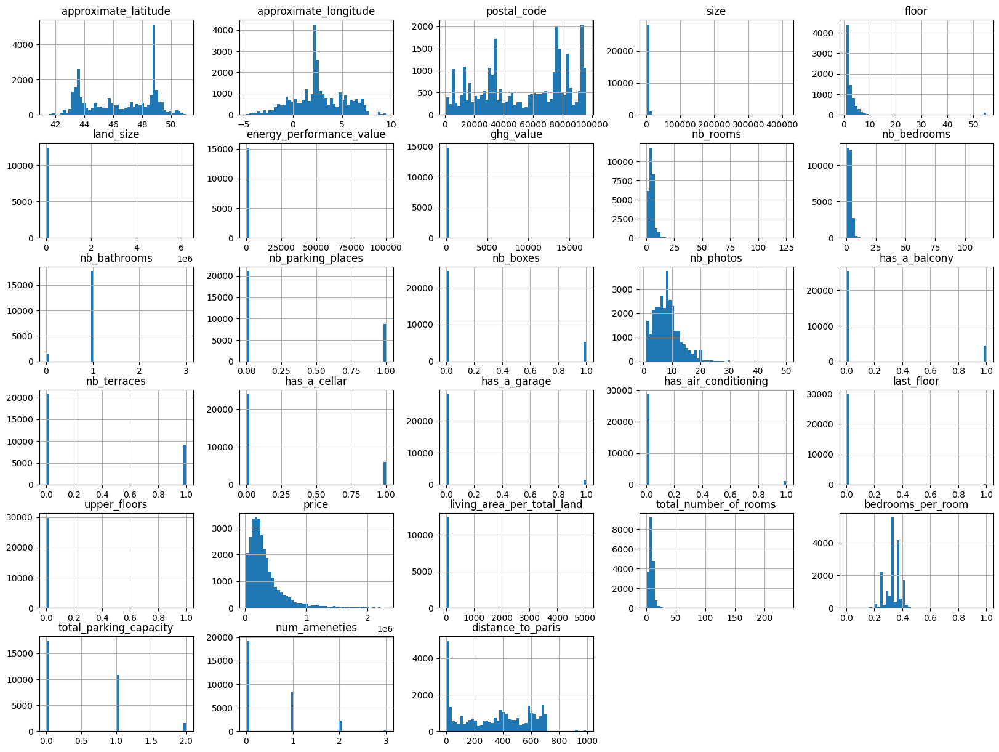

In [19]:
# Histogrammes
real_estate.hist(bins=50, figsize=(20, 15));

In [20]:
import plotly.express as px
px.scatter(real_estate, x='approximate_longitude', y='approximate_latitude')

In [21]:
px.scatter(real_estate, x='approximate_longitude', y='approximate_latitude', size="price", color="price")

In [22]:
px.scatter(real_estate, x='approximate_longitude', y='approximate_latitude', size="price", color="property_type")

In [23]:
px.scatter(real_estate[(real_estate['property_type'] == 'appartement') | (real_estate['property_type'] == 'maison')],
           x='approximate_longitude', y='approximate_latitude',
           size="price", color="property_type")

<ipython-input-24-db401214febc>:6: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



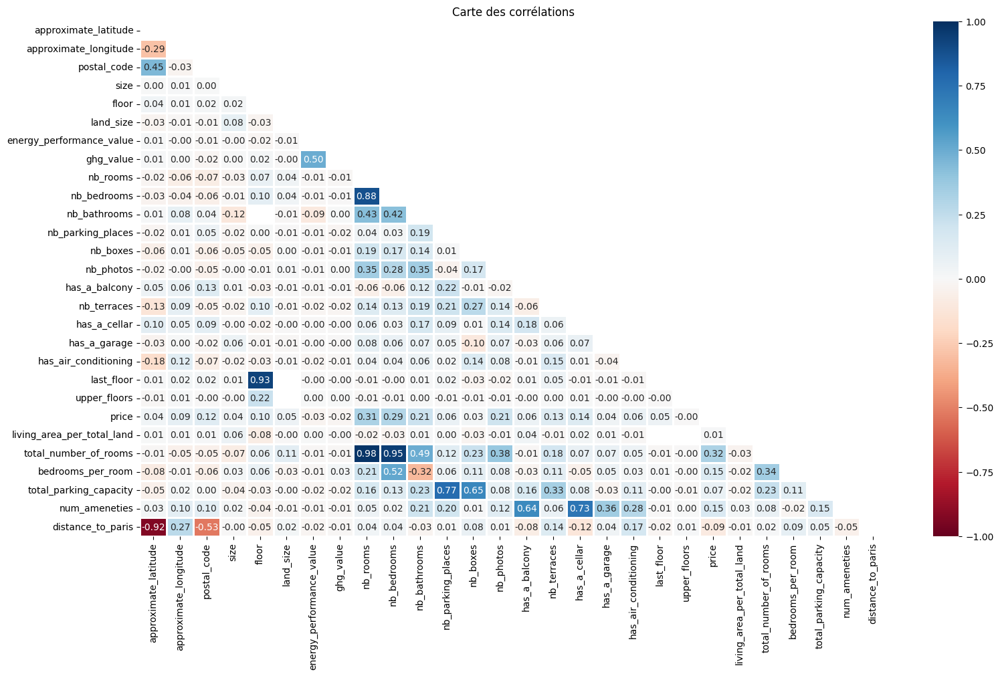

In [24]:
# Carte de corrélations
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
plt.figure(figsize=(18,10))
real_estate_corr = real_estate.corr()
mask = np.triu(np.ones_like(real_estate_corr, dtype=bool))
sns.heatmap(
    real_estate_corr, mask=mask, center=0,
    cmap='RdBu', linewidths=1, annot=True,
    fmt=".2f", vmin=-1, vmax=1
)
plt.title("Carte des corrélations")
plt.show()

-----------------price VS property_type ------------------------
property_type
parking              5.801333e+04
chambre              1.063750e+05
terrain à bâtir      1.083508e+05
terrain              1.218439e+05
viager               1.785017e+05
divers               3.059696e+05
ferme                3.214845e+05
maison               3.255814e+05
appartement          3.720782e+05
chalet               3.986384e+05
duplex               4.086984e+05
moulin               4.706545e+05
hôtel                4.910000e+05
loft                 5.049762e+05
villa                5.257610e+05
gîte                 5.550000e+05
propriété            6.504257e+05
péniche              6.925000e+05
hôtel particulier    7.083800e+05
manoir               7.822050e+05
château              1.078403e+06
atelier              1.300000e+06
Name: price, dtype: float64


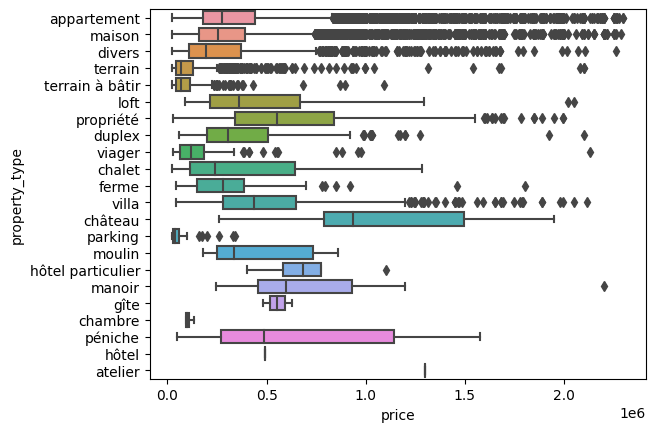

-----------------price VS energy_performance_category ------------------------
energy_performance_category
G    216562.129921
F    246950.354994
E    303041.066362
D    352285.848458
A    384611.190283
C    434601.926242
B    439656.787755
Name: price, dtype: float64


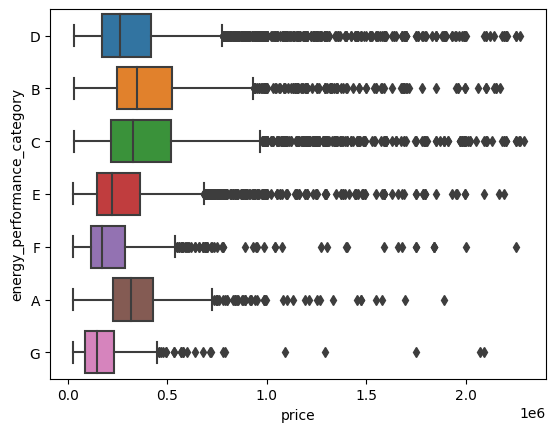

-----------------price VS ghg_category ------------------------
ghg_category
G    279869.831325
F    339485.526673
C    355154.803291
B    355794.675676
E    377837.122372
A    379216.728705
D    387317.205590
Name: price, dtype: float64


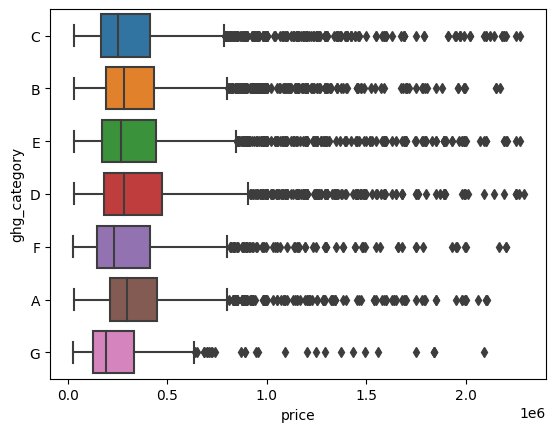

-----------------price VS exposition ------------------------
exposition
Nord          306179.398907
Nord-Ouest    321697.211111
Sud-Nord      358697.864286
Ouest         366705.218513
Est           367180.910394
Sud           392291.823234
Sud-Est       402456.744764
Est-Ouest     405793.345921
Nord-Est      435204.138889
Sud-Ouest     441905.737810
Nord-Sud      496062.142857
Ouest-Est     512836.821429
Name: price, dtype: float64


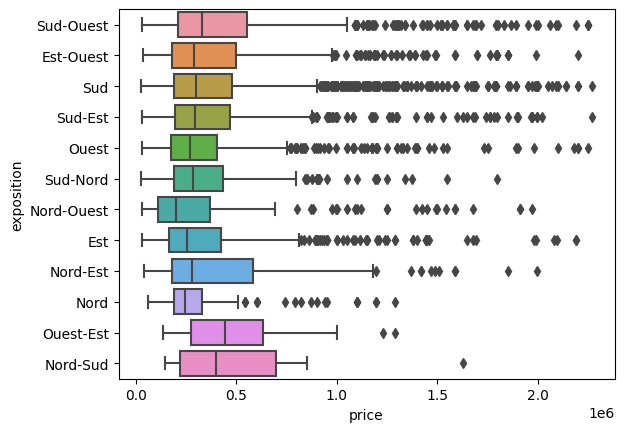

In [25]:
for col in list(real_estate.select_dtypes(include='object').drop('city', axis=1)):
  print("-----------------price VS", col, "------------------------")
  print(real_estate.groupby(col)['price'].mean().sort_values())
  sns.boxplot(data=real_estate, x='price', y=col)
  plt.show()
  plt.close()

# Data preprocessing

In [26]:
trainset = train_set.copy()

In [27]:
X_train = trainset.drop("price", axis=1)
y_train = trainset['price']

## Pipeline de prétraitement des variables numériques

In [28]:
# variables numériques
vars_num = list(trainset.drop('price', axis=1).select_dtypes(exclude='object'))
vars_num

['approximate_latitude',
 'approximate_longitude',
 'postal_code',
 'size',
 'floor',
 'land_size',
 'energy_performance_value',
 'ghg_value',
 'nb_rooms',
 'nb_bedrooms',
 'nb_bathrooms',
 'nb_parking_places',
 'nb_boxes',
 'nb_photos',
 'has_a_balcony',
 'nb_terraces',
 'has_a_cellar',
 'has_a_garage',
 'has_air_conditioning',
 'last_floor',
 'upper_floors']

In [30]:
# Fonction d'ajout de nouvelles variables
def add_features(Z):
  Z['living_area_per_total_land'] = Z['size']/Z['land_size']
  Z['total_number_of_rooms'] = Z['nb_rooms'] + Z['nb_bedrooms'] + Z['nb_bathrooms']
  Z['bedrooms_per_room'] = Z['nb_bedrooms']/Z['total_number_of_rooms']
  Z['total_parking_capacity'] = Z['nb_parking_places'] + Z['nb_boxes']
  Z['num_ameneties'] = Z['has_a_balcony'] + Z['has_a_cellar'] + Z['has_a_garage'] + Z['has_air_conditioning']
  Z['distance_to_paris'] = Z.apply(calculate_distance, axis=1)
  return Z.values

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer, StandardScaler, MinMaxScaler, RobustScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
num_pipeline = Pipeline([
    ('feats_adder', FunctionTransformer(add_features)),
    ('num_impute', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

num_pipeline

Pipeline(steps=[('feats_adder',
                 FunctionTransformer(func=<function add_features at 0x7f0120dddea0>)),
                ('num_impute', SimpleImputer(strategy='median')),
                ('scaler', StandardScaler())])

## Pipeline de prétraitement des variables catégorielles

In [31]:
# Variables catégorielles
vars_cat = list(trainset.select_dtypes(include='object').drop('city', axis=1))
vars_cat

['property_type', 'energy_performance_category', 'ghg_category', 'exposition']

In [32]:
cat_pipeline = Pipeline([
    ('cat_imputer', SimpleImputer(strategy='constant', fill_value="UNKNOWN")),
    ('encoder', OneHotEncoder(sparse_output=False, handle_unknown='infrequent_if_exist', min_frequency=0.002))
])
cat_pipeline

Pipeline(steps=[('cat_imputer',
                 SimpleImputer(fill_value='UNKNOWN', strategy='constant')),
                ('encoder',
                 OneHotEncoder(handle_unknown='infrequent_if_exist',
                               min_frequency=0.002, sparse_output=False))])

## Combinaison des deux pipelines en un seul pipeline

In [33]:
from sklearn.compose import ColumnTransformer
preprocessor = ColumnTransformer([
    ("num", num_pipeline, vars_num),
    ("cat", cat_pipeline, vars_cat)
])
preprocessor

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('feats_adder',
                                                  FunctionTransformer(func=<function add_features at 0x7f0120dddea0>)),
                                                 ('num_impute',
                                                  SimpleImputer(strategy='median')),
                                                 ('scaler', StandardScaler())]),
                                 ['approximate_latitude',
                                  'approximate_longitude', 'postal_code',
                                  'size', 'floor', 'land_size',
                                  'energy_performance_value', 'ghg_value',
                                  'nb_room...
                                  'has_a_cellar', 'has_a_garage',
                                  'has_air_conditioning', 'last_floor',
                                  'upper_floors']),
                                ('cat',
                                 Pipeline(steps=[('cat_imputer',
                                                  SimpleImputer(fill_value='UNKNOWN',
                                                                strategy='constant')),
                                                 ('encoder',
                                                  OneHotEncoder(handle_unknown='infrequent_if_exist',
                                                                min_frequency=0.002,
                                                                sparse_output=False))]),
                                 ['property_type',
                                  'energy_performance_category', 'ghg_category',
                                  'exposition'])])

In [34]:
# Application aux données d'entrainement
X_train_prepared = preprocessor.fit_transform(X_train)
print(X_train_prepared.shape)
X_train_prepared

(29894, 67)


array([[ 0.98030347, -0.06715911,  1.36829606, ...,  0.        ,
         1.        ,  0.        ],
       [-0.39282477, -1.40638835, -1.26840651, ...,  0.        ,
         1.        ,  0.        ],
       [-0.24320179, -0.84242234, -1.2979348 , ...,  0.        ,
         1.        ,  0.        ],
       ...,
       [-0.2605051 , -0.70053739, -1.29550306, ...,  0.        ,
         1.        ,  0.        ],
       [ 0.90957735, -1.71950283, -0.6410172 , ...,  0.        ,
         1.        ,  0.        ],
       [-0.09496148,  1.48887805,  0.71172586, ...,  0.        ,
         1.        ,  0.        ]])

## Expérimentations ML pour la sélection de modèle

In [35]:
# Régression linéaire
from sklearn.linear_model import LinearRegression
lin_reg = LinearRegression()
lin_reg.fit(X_train_prepared, y_train)

LinearRegression()

In [36]:
# Prédictions
y_train_preds = lin_reg.predict(X_train_prepared)

# RMSE
from sklearn.metrics import mean_squared_error
lin_rmse = mean_squared_error(y_train, y_train_preds, squared=False)
lin_rmse

268519.6790813511

In [37]:
# Validation croisée
from sklearn.model_selection import cross_val_score
scores = cross_val_score(lin_reg, X_train_prepared, y_train, scoring="neg_mean_squared_error", cv=3)
lin_rmse_scores = np.sqrt(-scores)
lin_rmse_scores

array([272102.65531944, 272030.35790534, 269862.42680286])

In [38]:
def display_scores(scores):
  print("Scores:", scores)
  print("Mean:", scores.mean())
  print("Standard deviation:", scores.std())

In [39]:
display_scores(lin_rmse_scores)

Scores: [272102.65531944 272030.35790534 269862.42680286]
Mean: 271331.8133425482
Standard deviation: 1039.4323230437271


In [40]:
def train_and_evaluate(ml_algo):
  reg = ml_algo
  reg.fit(X_train_prepared, y_train)

  y_train_predictions = reg.predict(X_train_prepared)
  reg_rmse = mean_squared_error(y_train, y_train_predictions, squared=False)
  print("RMSE:", reg_rmse)

  reg_scores = cross_val_score(reg, X_train_prepared, y_train, scoring="neg_mean_squared_error", cv=3)
  reg_rmse_scores = np.sqrt(-reg_scores)
  display_scores(reg_rmse_scores)
  return reg

In [41]:
all_models = []
from sklearn.ensemble import RandomForestRegressor
from xgboost.sklearn import XGBRegressor
from sklearn.neural_network import MLPRegressor
for ml_algo in [RandomForestRegressor(random_state=seed), XGBRegressor(random_state=seed)]:
  print(ml_algo)
  model = train_and_evaluate(ml_algo)
  all_models.append(model)
  print('\n')

RandomForestRegressor(random_state=123)
RMSE: 56579.313618180415
Scores: [158875.65614356 157124.34426933 158029.27379189]
Mean: 158009.7580682598
Standard deviation: 715.1032409389485


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=123, ...)
RMSE: 101731.41656814984
Scores: [157229.92100088 156128.9839971  155127.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.



RMSE: 269489.817452861


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.



Scores: [270662.4286414  276477.69086311 275032.43994202]
Mean: 274057.5198155104
Standard deviation: 2472.1341140266527




/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.



# Réglage des hyperparamètres

In [42]:
num_pipeline = Pipeline([
    ('feats_adder', FunctionTransformer(add_features)),
    ('num_impute', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

cat_pipeline = Pipeline([
    ('cat_imputer', SimpleImputer(strategy='constant', fill_value="UNKNOWN")),
    ('encoder', OneHotEncoder(sparse_output=False, handle_unknown='infrequent_if_exist', min_frequency=0.002))
])

preprocessor = ColumnTransformer([
    ("num", num_pipeline, vars_num),
    ("cat", cat_pipeline, vars_cat)
])

full_pipeline = Pipeline([
    ("preprocess", preprocessor),
    ('model', XGBRegressor(random_state=seed))
])

full_pipeline

Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('feats_adder',
                                                                   FunctionTransformer(func=<function add_features at 0x7f0120dddea0>)),
                                                                  ('num_impute',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['approximate_latitude',
                                                   'approximate_longitude',
                                                   'postal_code', 'size',
                                                   'floor', 'land_size',
                                                   'energy_performan...
                              feature_types=None, gamma=None, gpu_id=None,
                              grow_policy=None, importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, n_estimators=100,
                              n_jobs=None, num_parallel_tree=None,
                              predictor=None, random_state=123, ...))])

In [43]:
full_pipeline[1]

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=123, ...)

In [44]:
X_train = train_set.drop('price', axis=1)
y_train = train_set['price']

In [45]:
from scipy.stats import randint

param_dist = {
    'model__n_estimators': randint(low=150, high=200),
    'model__max_depth': randint(low=5, high=10),
    'model__learning_rate': np.arange(0.05, 1, 0.05),
    'model__colsample_bytree': np.arange(0.5, 1, 0.05)
}

from sklearn.model_selection import RandomizedSearchCV
rnd_search = RandomizedSearchCV(
    full_pipeline, param_distributions=param_dist,
    n_iter=15, cv=3, scoring='neg_mean_squared_error',
    random_state=seed, n_jobs=-1
)

rnd_search.fit(X_train, y_train)

print("Meilleurs hyperparamètres :", rnd_search.best_params_)
print("Meilleur score :", np.sqrt(-rnd_search.best_score_))

Meilleurs hyperparamètres : {'model__colsample_bytree': 0.9000000000000001, 'model__learning_rate': 0.2, 'model__max_depth': 7, 'model__n_estimators': 184}
Meilleur score : 149938.72793306006


In [46]:
pd.DataFrame(rnd_search.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model__colsample_bytree,param_model__learning_rate,param_model__max_depth,param_model__n_estimators,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,85.806357,1.973371,5.423286,0.941552,0.7,0.15,17,198,{'model__colsample_bytree': 0.7000000000000001...,-2.463127e+10,-2.383725e+10,-2.354171e+10,-2.400341e+10,4.600675e+08,5
1,28.329427,0.883092,3.677606,0.087910,0.35,0.9,8,206,{'model__colsample_bytree': 0.3500000000000000...,-3.810568e+10,-3.810042e+10,-3.830093e+10,-3.816901e+10,9.330839e+07,13
2,15.327104,0.135754,5.191539,1.181500,0.1,0.05,6,226,"{'model__colsample_bytree': 0.1, 'model__learn...",-3.560105e+10,-3.596716e+10,-3.551518e+10,-3.569446e+10,1.959861e+08,12
3,37.446060,0.751917,3.938265,0.374962,0.8,0.5,5,274,"{'model__colsample_bytree': 0.8, 'model__learn...",-2.625865e+10,-2.554391e+10,-2.471575e+10,-2.550611e+10,6.304526e+08,7
4,13.741674,0.648771,5.354400,0.534451,0.05,0.8,14,183,"{'model__colsample_bytree': 0.05, 'model__lear...",-5.693793e+10,-5.750006e+10,-5.717322e+10,-5.720374e+10,2.304996e+08,15
5,25.439570,0.140720,4.827914,0.119229,0.75,0.25,5,168,{'model__colsample_bytree': 0.7500000000000001...,-2.459456e+10,-2.437378e+10,-2.454234e+10,-2.450356e+10,9.421278e+07,6
6,39.812134,1.113985,4.484374,1.161717,0.9,0.2,7,184,{'model__colsample_bytree': 0.9000000000000001...,-2.290932e+10,-2.198783e+10,-2.254772e+10,-2.248162e+10,3.790890e+08,1
7,24.456361,1.325436,5.344011,1.258013,0.4,0.15,9,147,"{'model__colsample_bytree': 0.4, 'model__learn...",-2.303173e+10,-2.287915e+10,-2.276641e+10,-2.289243e+10,1.087219e+08,2
8,77.439861,0.588447,4.647497,0.853748,0.85,0.4,14,199,{'model__colsample_bytree': 0.8500000000000001...,-2.696224e+10,-2.487179e+10,-2.691863e+10,-2.625089e+10,9.753338e+08,8
9,33.658663,0.320659,4.983260,0.899901,0.35,0.1,10,218,{'model__colsample_bytree': 0.3500000000000000...,-2.333102e+10,-2.280593e+10,-2.301210e+10,-2.304968e+10,2.160116e+08,3


In [47]:
final_model = rnd_search.best_estimator_
final_model

Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('feats_adder',
                                                                   FunctionTransformer(func=<function add_features at 0x7f0120dddea0>)),
                                                                  ('num_impute',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['approximate_latitude',
                                                   'approximate_longitude',
                                                   'postal_code', 'size',
                                                   'floor', 'land_size',
                                                   'energy_performan...
                              feature_types=None, gamma=None, gpu_id=None,
                              grow_policy=None, importance_type=None,
                              interaction_constraints=None, learning_rate=0.2,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=7, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, n_estimators=184,
                              n_jobs=None, num_parallel_tree=None,
                              predictor=None, random_state=123, ...))])

In [48]:
# Données de test
X_test = test_set.drop("price", axis=1)
y_test = test_set['price']

In [49]:
# Prédictions sur les données de test
final_preds = final_model.predict(X_test)
final_rmse = mean_squared_error(y_test, final_preds, squared=False)
final_rmse

144844.29555479132

In [50]:
# Importance des attributs
feature_importances = final_model[1].feature_importances_
feature_importances

array([0.01156984, 0.01751729, 0.01689598, 0.03579644, 0.00737269,
       0.0164356 , 0.01035026, 0.00718028, 0.11434027, 0.1014965 ,
       0.01392518, 0.00635478, 0.00714034, 0.00957858, 0.00570821,
       0.03025274, 0.00658427, 0.00795163, 0.02566424, 0.        ,
       0.0026027 , 0.00789026, 0.03186588, 0.00654772, 0.00521083,
       0.00672265, 0.10567876, 0.05283789, 0.03133549, 0.00567106,
       0.0049017 , 0.01682846, 0.0207537 , 0.03165504, 0.01542963,
       0.00344413, 0.02542668, 0.00706386, 0.01912046, 0.00359631,
       0.00636081, 0.00631994, 0.00479754, 0.00206311, 0.00035707,
       0.        , 0.00863487, 0.01470675, 0.00486752, 0.00473296,
       0.00682487, 0.00623803, 0.00733856, 0.        , 0.00943856,
       0.00118197, 0.00767726, 0.00103419, 0.01324761, 0.00318943,
       0.00393598, 0.00393895, 0.00834935, 0.00969775, 0.00442224,
       0.00394639, 0.        ], dtype=float32)

In [51]:
len(feature_importances)

67

In [52]:
extra_attribs = [
    'living_area_per_total_land',
    'total_number_of_rooms',
    'bedrooms_per_room',
    'total_parking_capacity',
    'num_ameneties',
    'distance_to_paris'
]

cat_ohe_attribs = list(final_model[0].named_transformers_['cat'].get_feature_names_out())

attributes = vars_num + extra_attribs + cat_ohe_attribs
print(len(attributes))
attributes

67


['approximate_latitude',
 'approximate_longitude',
 'postal_code',
 'size',
 'floor',
 'land_size',
 'energy_performance_value',
 'ghg_value',
 'nb_rooms',
 'nb_bedrooms',
 'nb_bathrooms',
 'nb_parking_places',
 'nb_boxes',
 'nb_photos',
 'has_a_balcony',
 'nb_terraces',
 'has_a_cellar',
 'has_a_garage',
 'has_air_conditioning',
 'last_floor',
 'upper_floors',
 'living_area_per_total_land',
 'total_number_of_rooms',
 'bedrooms_per_room',
 'total_parking_capacity',
 'num_ameneties',
 'distance_to_paris',
 'property_type_appartement',
 'property_type_divers',
 'property_type_duplex',
 'property_type_ferme',
 'property_type_maison',
 'property_type_parking',
 'property_type_propriété',
 'property_type_terrain',
 'property_type_terrain à bâtir',
 'property_type_viager',
 'property_type_villa',
 'property_type_infrequent_sklearn',
 'energy_performance_category_A',
 'energy_performance_category_B',
 'energy_performance_category_C',
 'energy_performance_category_D',
 'energy_performance_categ

In [53]:
importance_result = sorted(zip(feature_importances, attributes), reverse=True)
imp_df = pd.DataFrame(importance_result, columns=["Score d'importance", "Variable"])
imp_df

,Score d'importance,Variable
0,0.114340,nb_rooms
1,0.105679,distance_to_paris
2,0.101497,nb_bedrooms
3,0.052838,property_type_appartement
4,0.035796,size
...,...,...
62,0.000357,energy_performance_category_F
63,0.000000,last_floor
64,0.000000,ghg_category_G
65,0.000000,exposition_infrequent_sklearn


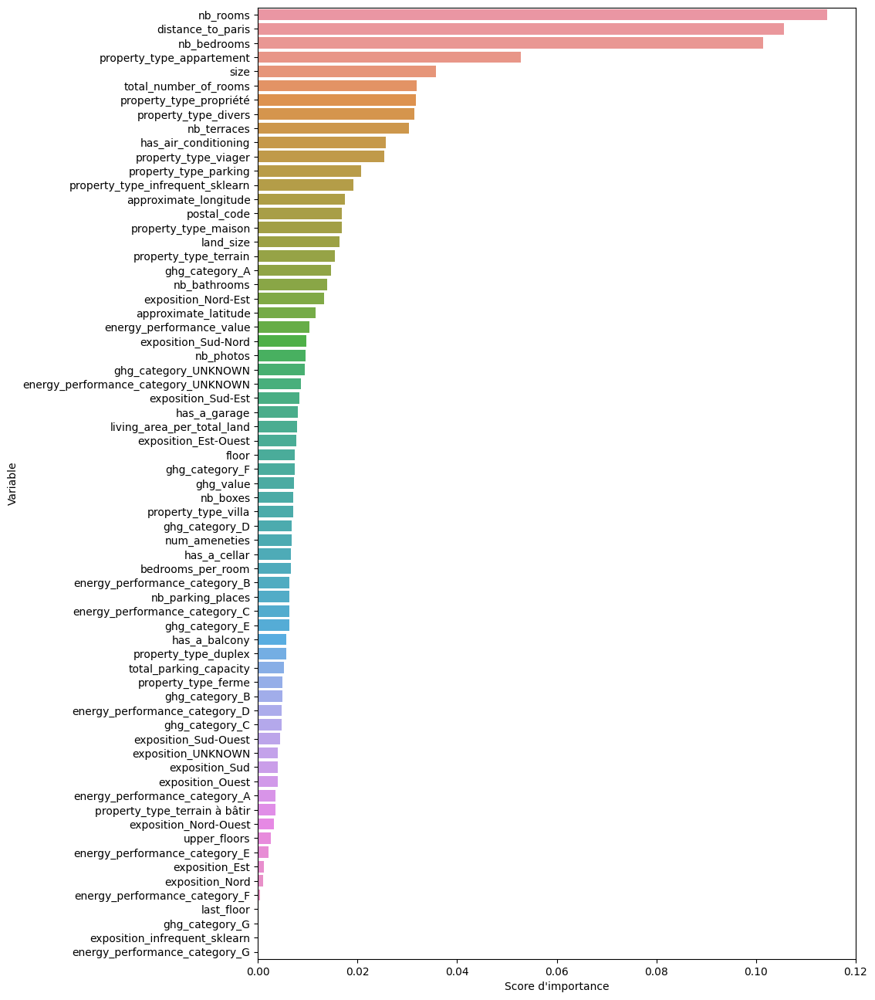

In [54]:
plt.figure(figsize=(10,16))
sns.barplot(data=imp_df, x="Score d'importance", y="Variable");

In [ ]:
# Enregistrement
import joblib
joblib.dump(final_model, "final_model.pkl")

In [ ]:
!ls